In [2]:
%%capture
!pip install tslearn

In [4]:
import os
os.chdir('../src/')

In [5]:
# import third party libraries
import matplotlib.pyplot as plt
import numpy as np
import torch
from scipy.interpolate import interp1d
from tqdm import tqdm
from tslearn.datasets import UCR_UEA_datasets
from tqdm import tqdm
from torch.utils.data import DataLoader

from DTWLoss_CUDA import DTWLoss

In [ ]:
ucr = UCR_UEA_datasets()

# Data exploration

We spent hours trying to find good data. However, after much trial and error, we came to the conclusion that finding the perfect data was complicated because we need short signals with interesting properties to compare MSE and Soft-DTW. We discovered the **tslearn** database, which consisted of a simple but insightful set of data. The data is clean and reliable. We therefore chose the data on the basis of signal shape, length and number of classes. The first step was to display these quantities.

Adiac : shape : (390, 176, 1) and number of classes : 37


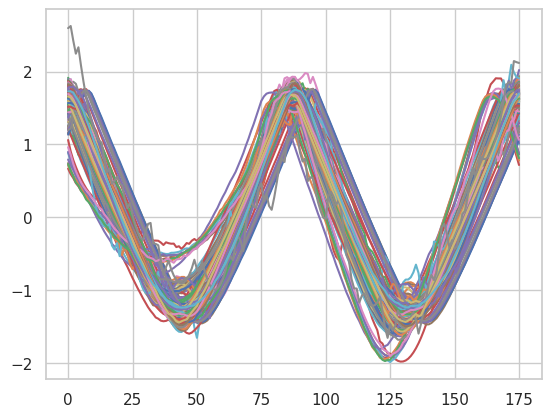

ArrowHead : shape : (36, 251, 1) and number of classes : 3


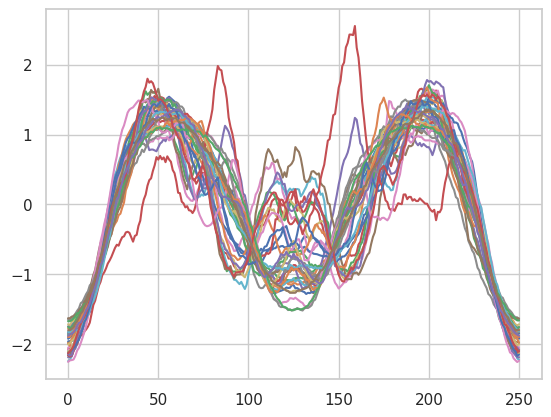

Beef : shape : (30, 470, 1) and number of classes : 5


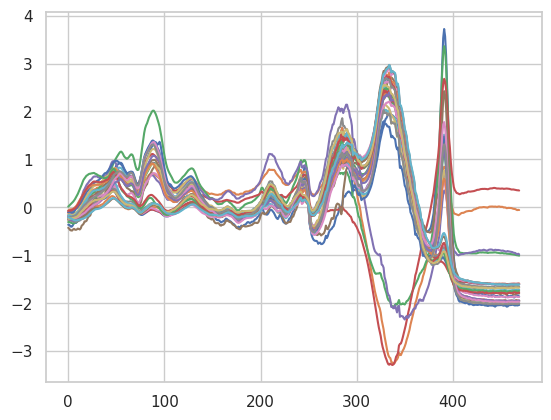

BeetleFly : shape : (20, 512, 1) and number of classes : 2


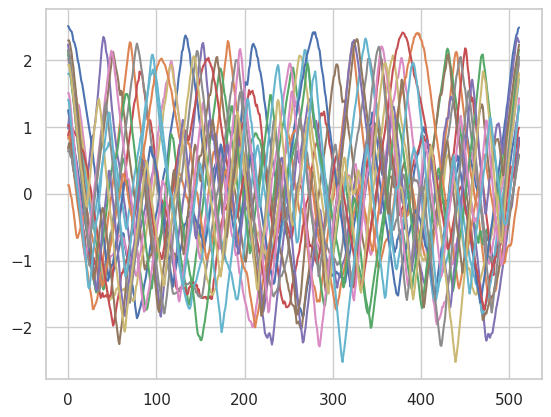

BirdChicken : shape : (20, 512, 1) and number of classes : 2


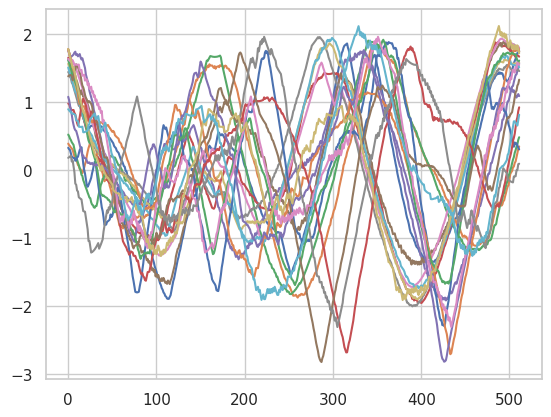

Car : shape : (60, 577, 1) and number of classes : 4


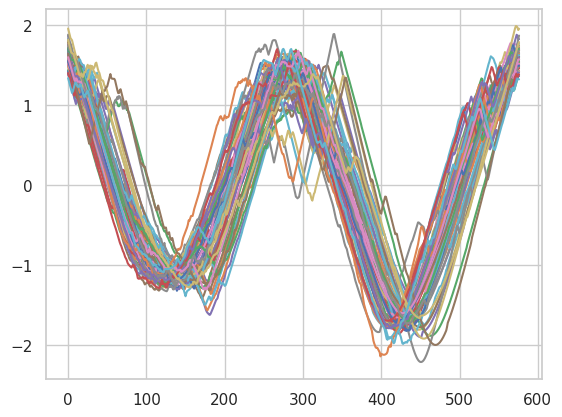

CBF : shape : (30, 128, 1) and number of classes : 3


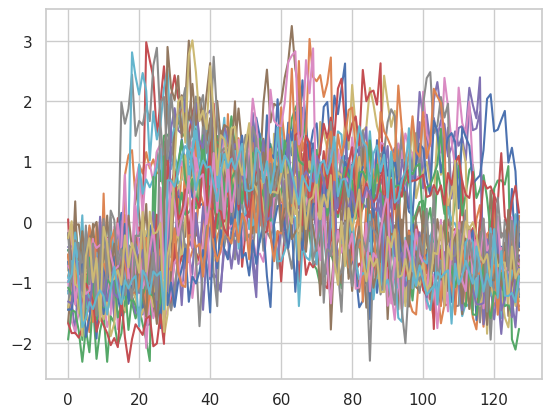

ChlorineConcentration : shape : (467, 166, 1) and number of classes : 3


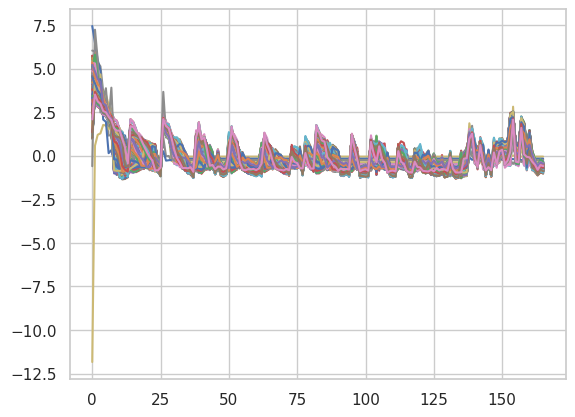

CinCECGTorso : shape : (40, 1639, 1) and number of classes : 4


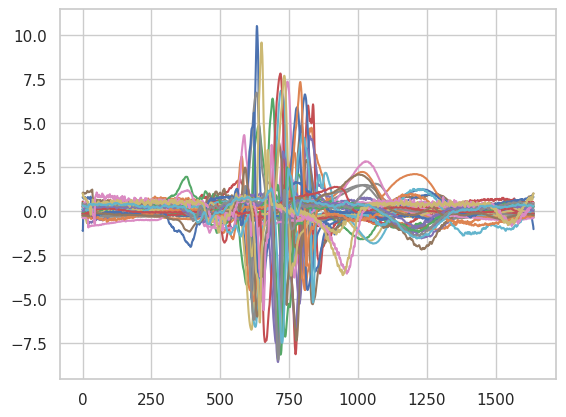

Coffee : shape : (28, 286, 1) and number of classes : 2


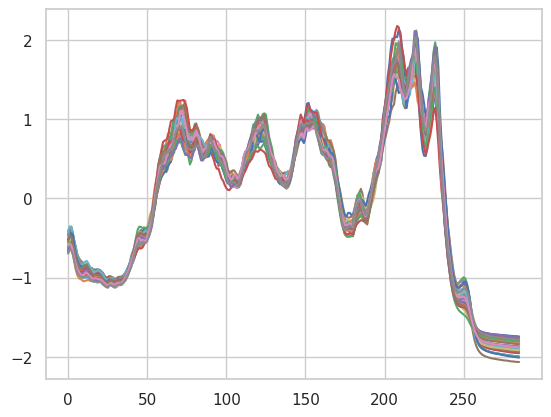

Computers : shape : (250, 720, 1) and number of classes : 2


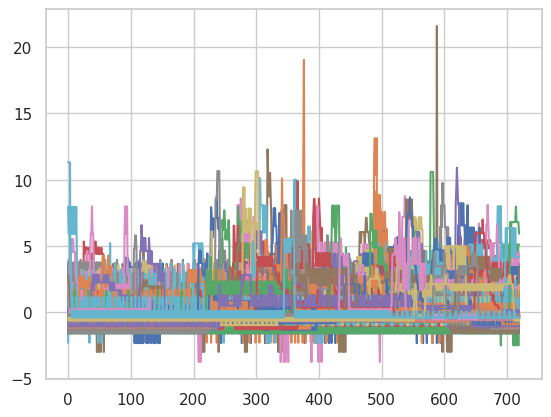

CricketX : shape : (390, 300, 1) and number of classes : 12


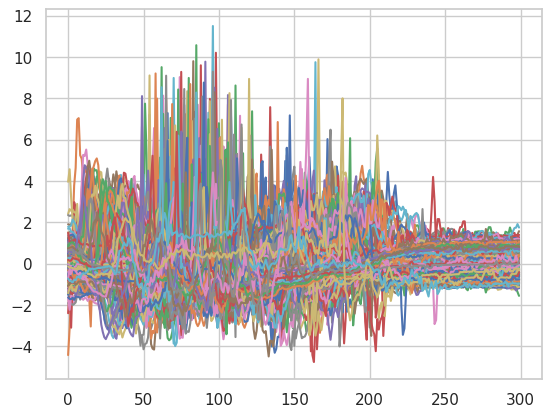

CricketY : shape : (390, 300, 1) and number of classes : 12


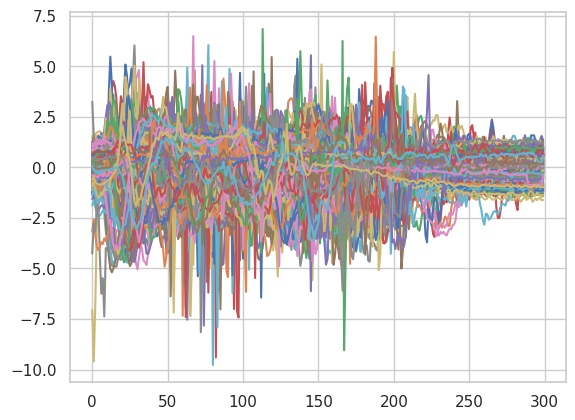

CricketZ : shape : (390, 300, 1) and number of classes : 12


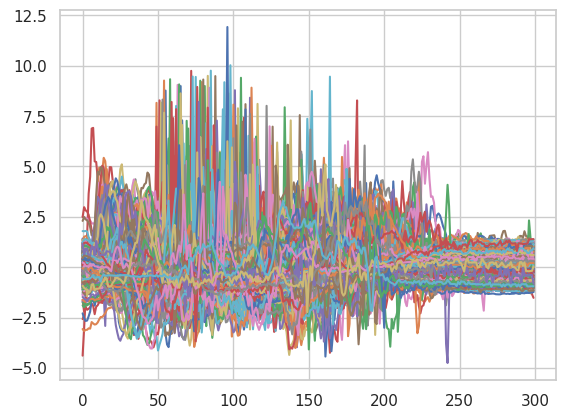

DiatomSizeReduction : shape : (16, 345, 1) and number of classes : 4


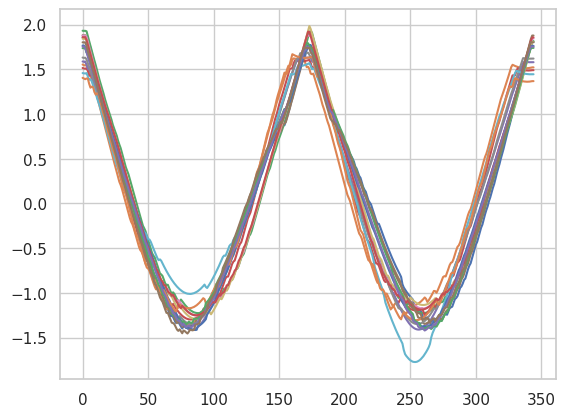

DistalPhalanxOutlineCorrect : shape : (600, 80, 1) and number of classes : 2


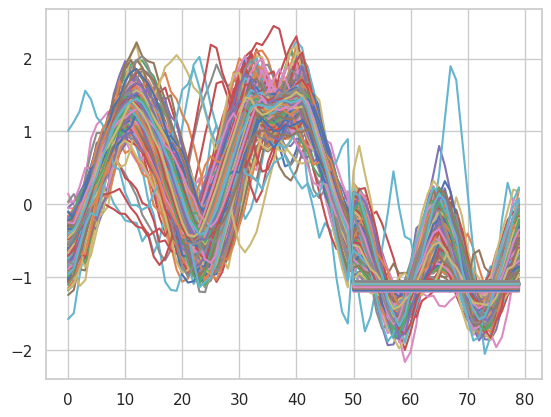

DistalPhalanxOutlineAgeGroup : shape : (400, 80, 1) and number of classes : 3


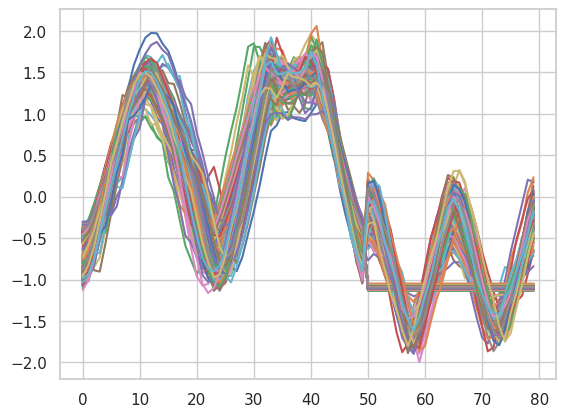

DistalPhalanxTW : shape : (400, 80, 1) and number of classes : 6


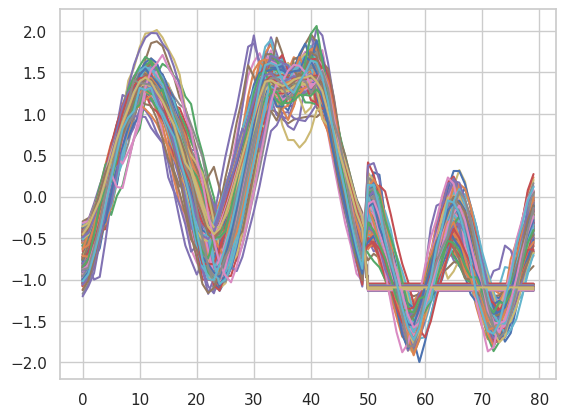

Earthquakes : shape : (322, 512, 1) and number of classes : 2


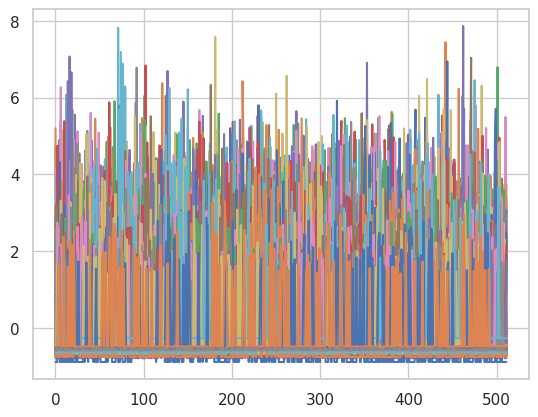

ECG200 : shape : (100, 96, 1) and number of classes : 2


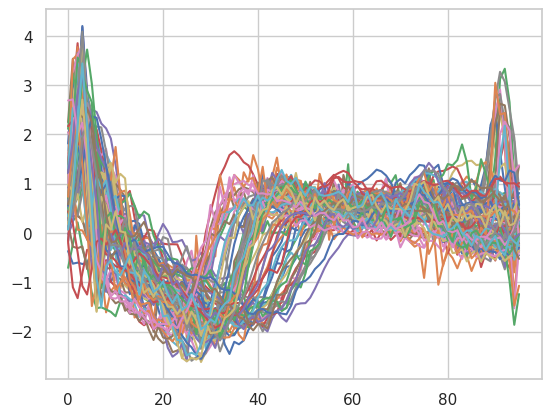

ECG5000 : shape : (500, 140, 1) and number of classes : 5


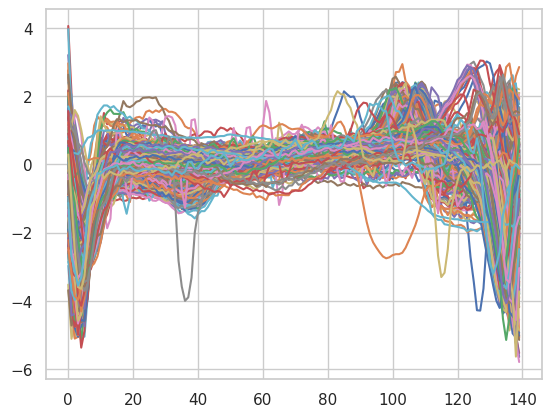

ECGFiveDays : shape : (23, 136, 1) and number of classes : 2


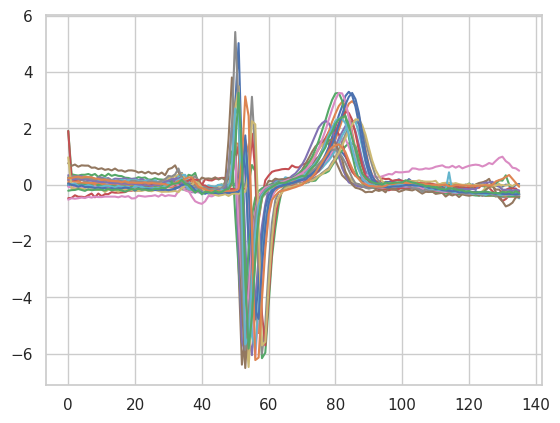

ElectricDevices : shape : (8926, 96, 1) and number of classes : 7


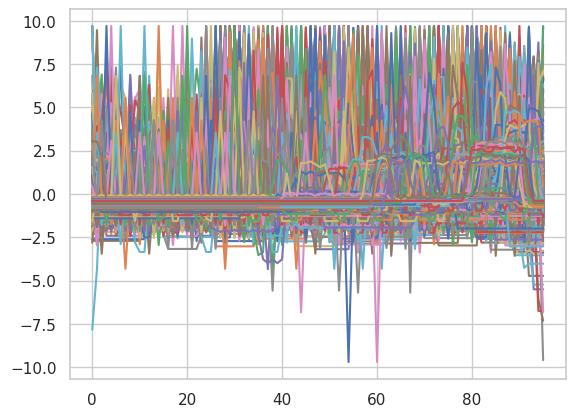

FaceAll : shape : (560, 131, 1) and number of classes : 14


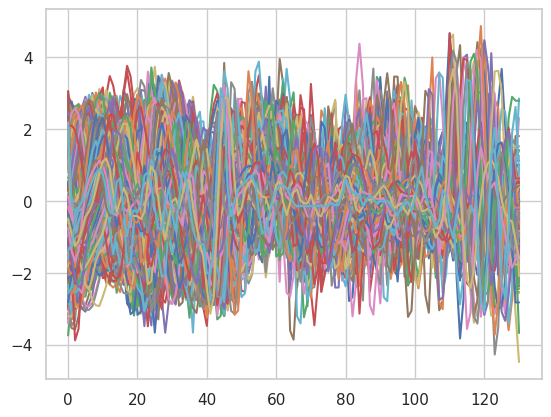

FaceFour : shape : (24, 350, 1) and number of classes : 4


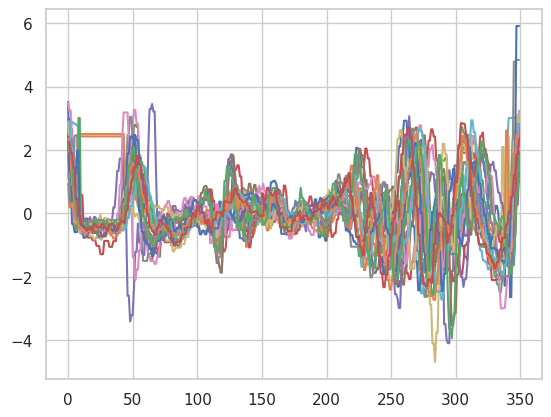

FacesUCR : shape : (200, 131, 1) and number of classes : 14


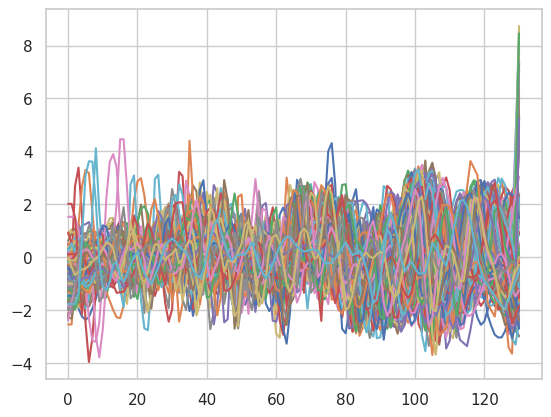

FiftyWords : shape : (450, 270, 1) and number of classes : 50


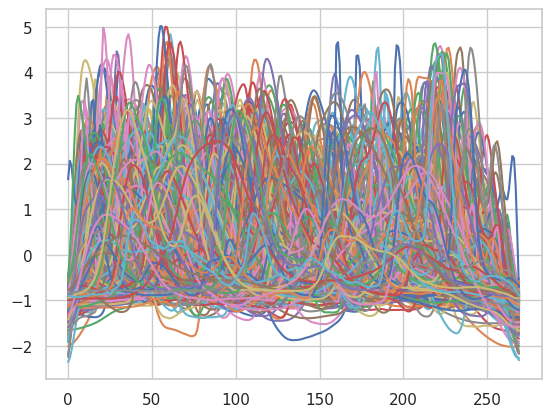

Fish : shape : (175, 463, 1) and number of classes : 7


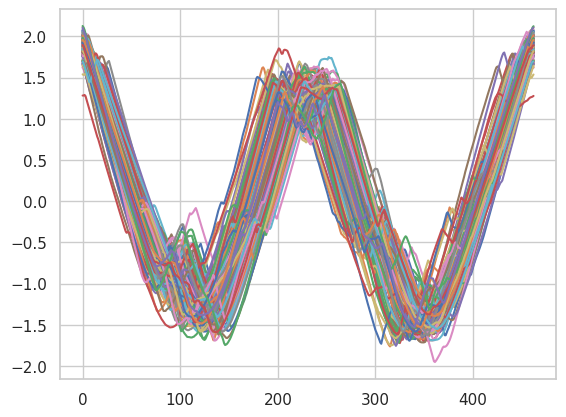

FordA : shape : (3601, 500, 1) and number of classes : 2


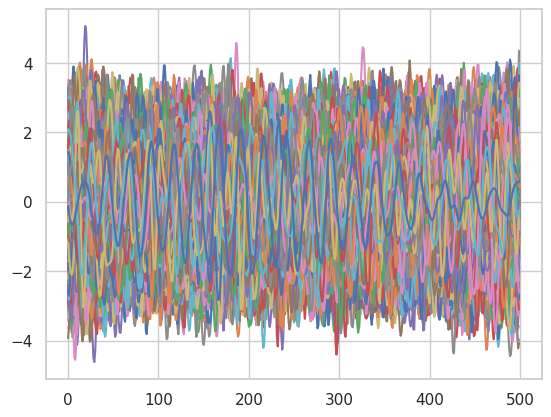

FordB : shape : (3636, 500, 1) and number of classes : 2


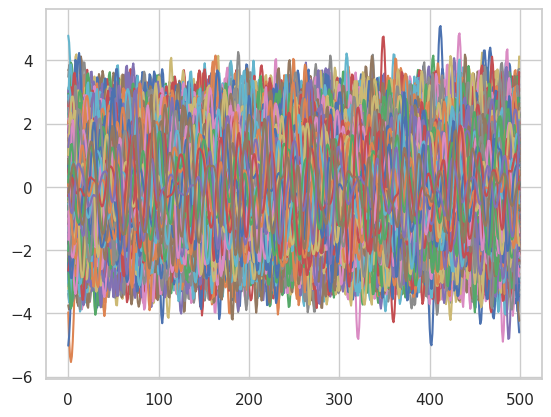

GunPoint : shape : (50, 150, 1) and number of classes : 2


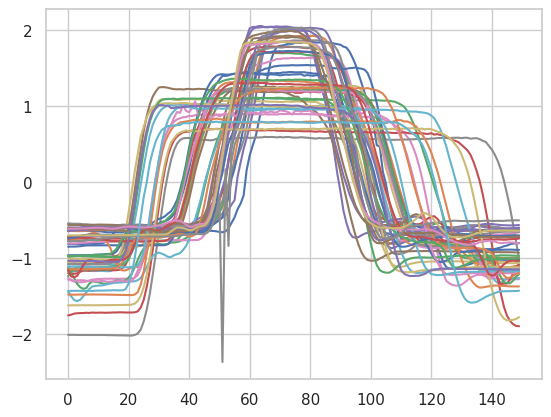

Ham : shape : (109, 431, 1) and number of classes : 2


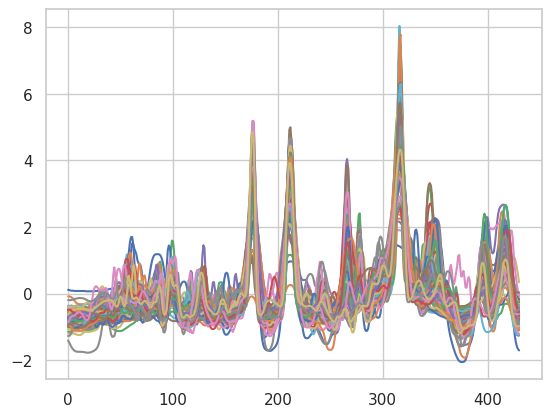

HandOutlines : shape : (1000, 2709, 1) and number of classes : 2


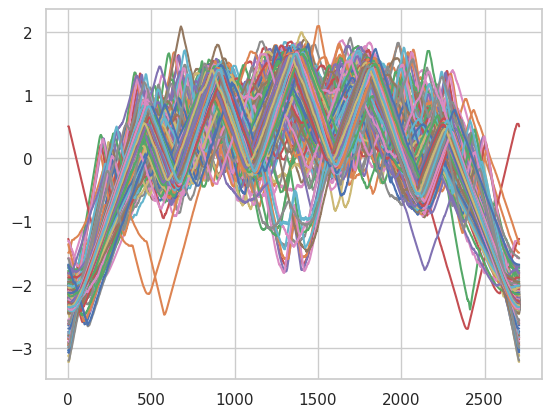

Haptics : shape : (155, 1092, 1) and number of classes : 5


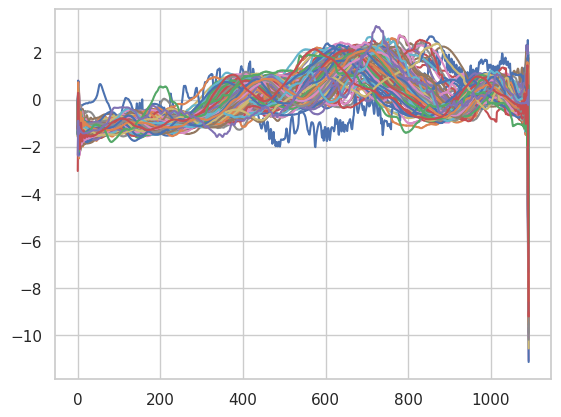

Herring : shape : (64, 512, 1) and number of classes : 2


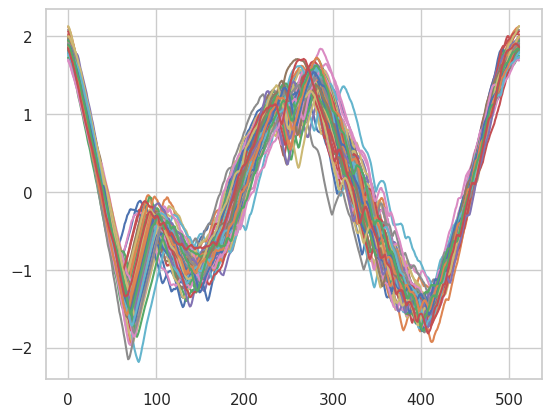

InlineSkate : shape : (100, 1882, 1) and number of classes : 7


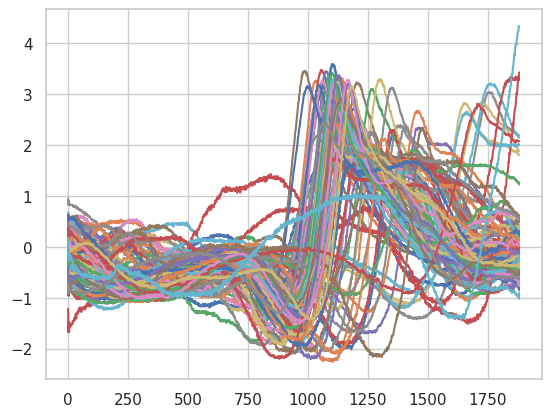

InsectWingbeatSound : shape : (220, 256, 1) and number of classes : 11


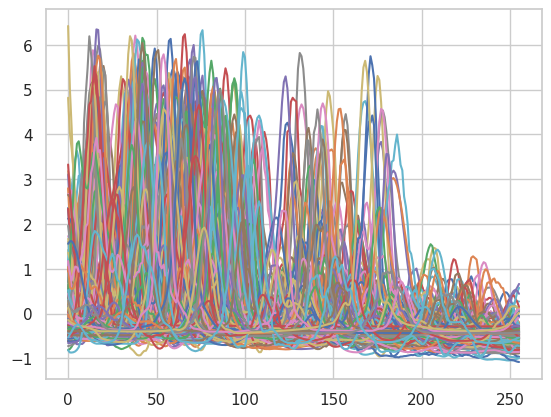

ItalyPowerDemand : shape : (67, 24, 1) and number of classes : 2


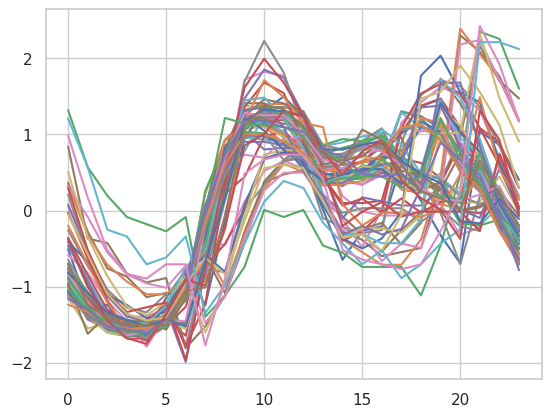

LargeKitchenAppliances : shape : (375, 720, 1) and number of classes : 3


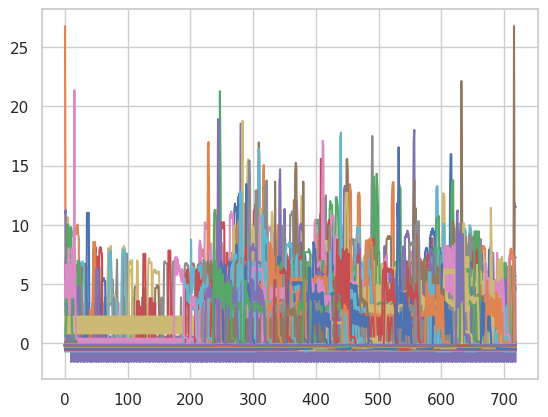

Lightning2 : shape : (60, 637, 1) and number of classes : 2


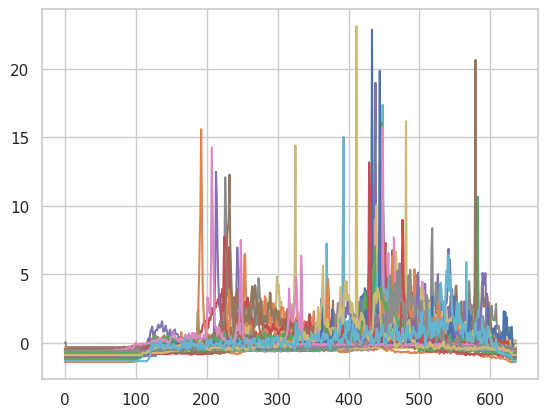

Lightning7 : shape : (70, 319, 1) and number of classes : 7


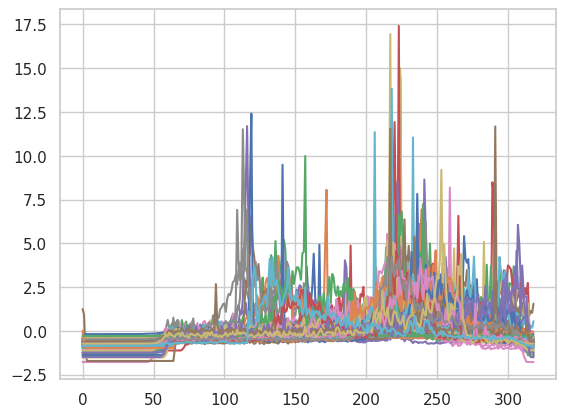

Mallat : shape : (55, 1024, 1) and number of classes : 8


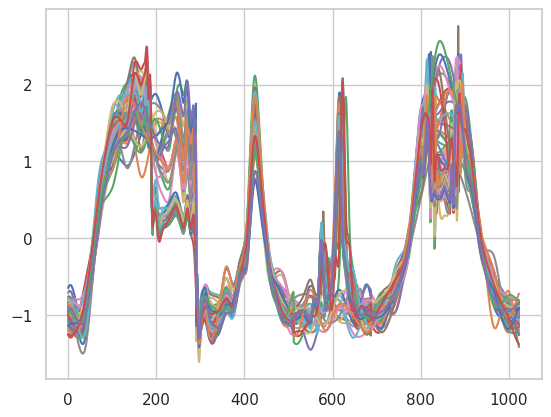

Meat : shape : (60, 448, 1) and number of classes : 3


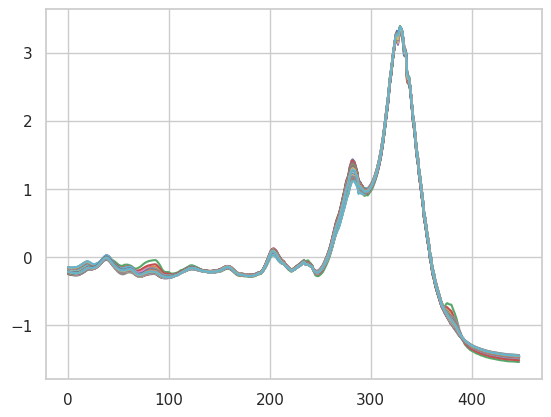

MedicalImages : shape : (381, 99, 1) and number of classes : 10


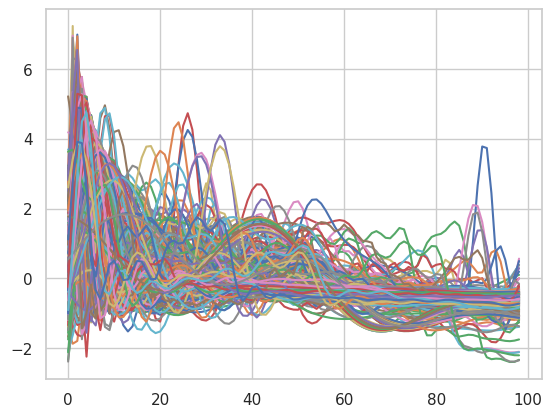

MiddlePhalanxOutlineCorrect : shape : (600, 80, 1) and number of classes : 2


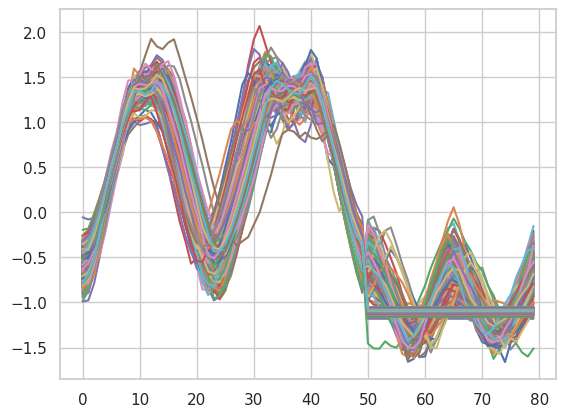

MiddlePhalanxOutlineAgeGroup : shape : (400, 80, 1) and number of classes : 3


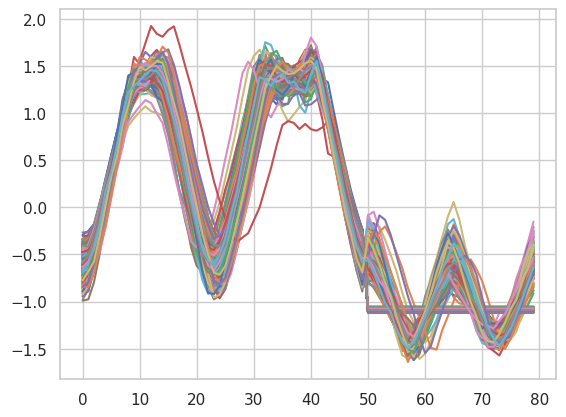

MiddlePhalanxTW : shape : (399, 80, 1) and number of classes : 6


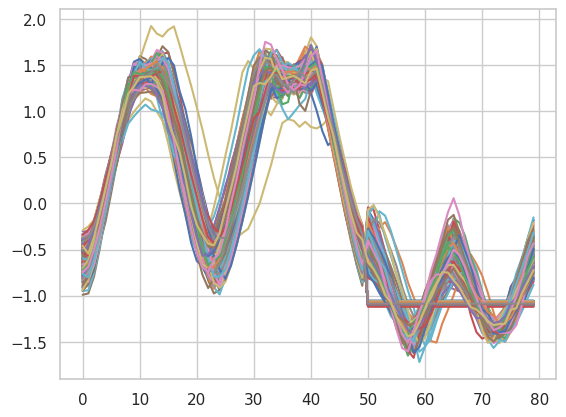

MoteStrain : shape : (20, 84, 1) and number of classes : 2


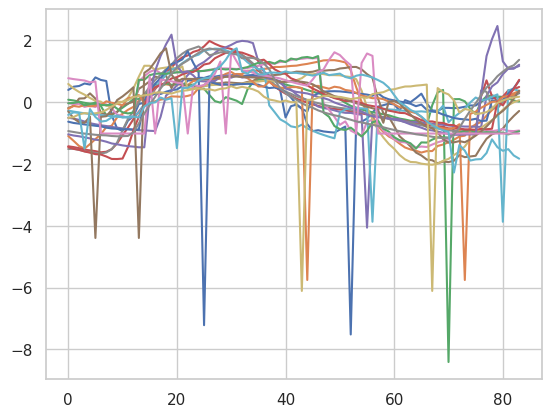

NonInvasiveFatalECGThorax1 : shape : (1800, 750, 1) and number of classes : 42


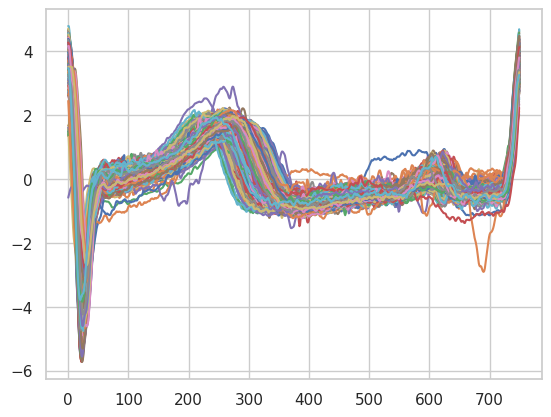

NonInvasiveFatalECGThorax2 : shape : (1800, 750, 1) and number of classes : 42


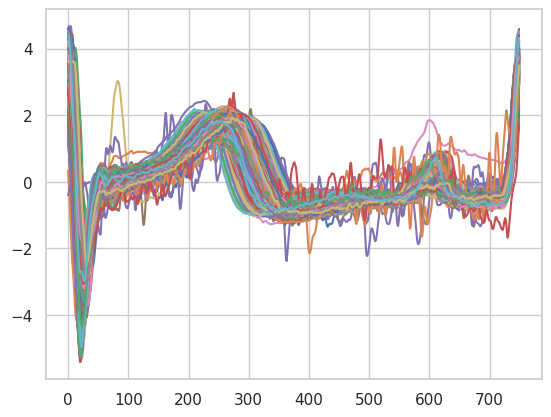

OliveOil : shape : (30, 570, 1) and number of classes : 4


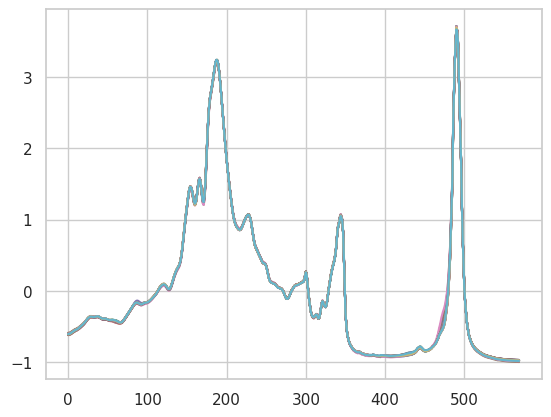

OSULeaf : shape : (200, 427, 1) and number of classes : 6


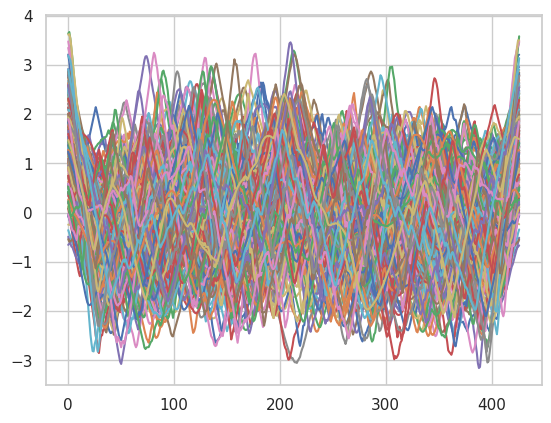

PhalangesOutlinesCorrect : shape : (1800, 80, 1) and number of classes : 2


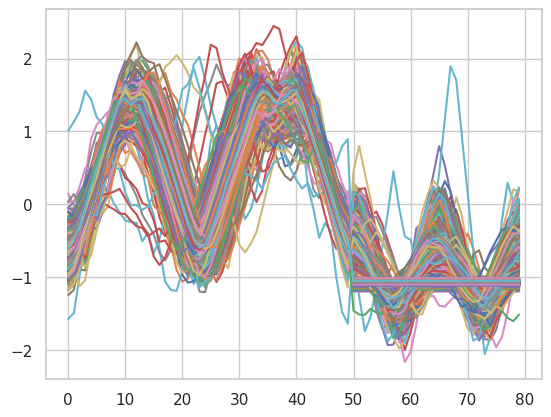

Phoneme : shape : (214, 1024, 1) and number of classes : 39


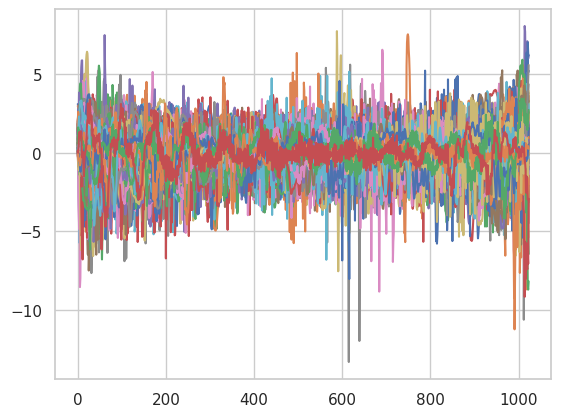

Plane : shape : (105, 144, 1) and number of classes : 7


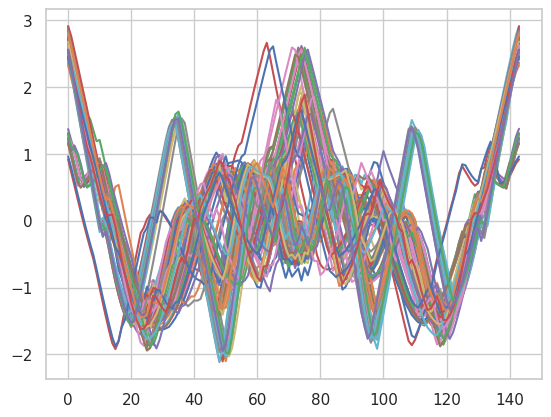

ProximalPhalanxOutlineCorrect : shape : (600, 80, 1) and number of classes : 2


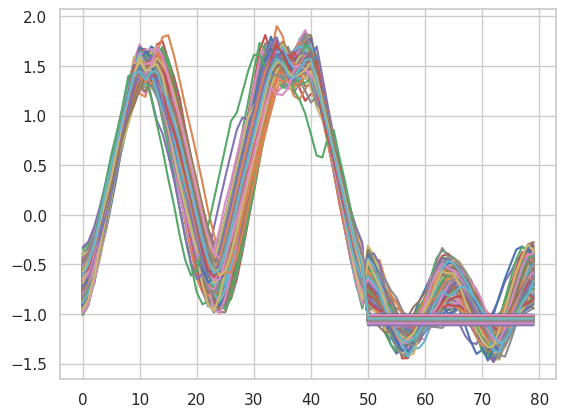

ProximalPhalanxOutlineAgeGroup : shape : (400, 80, 1) and number of classes : 3


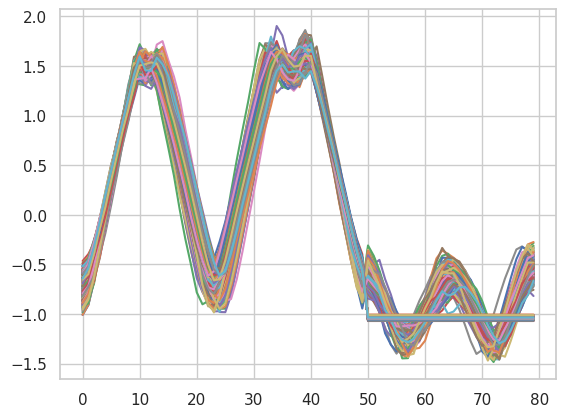

ProximalPhalanxTW : shape : (400, 80, 1) and number of classes : 6


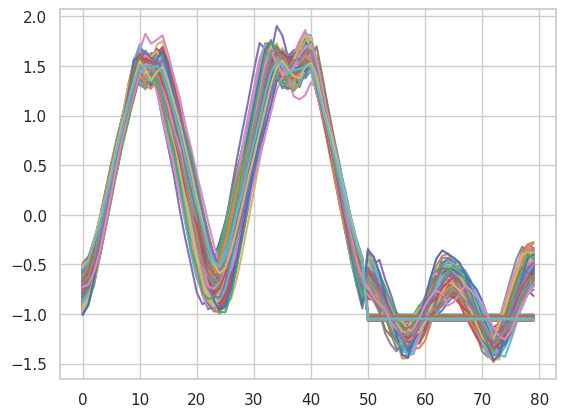

RefrigerationDevices : shape : (375, 720, 1) and number of classes : 3


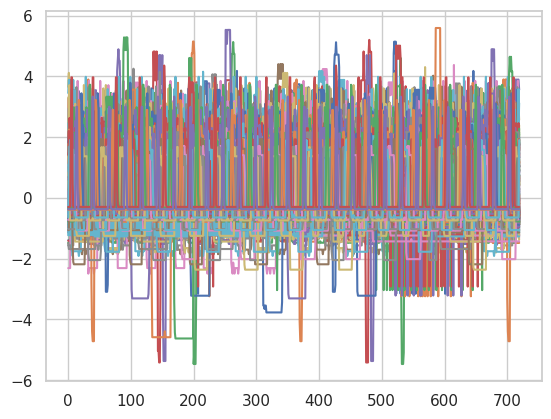

ScreenType : shape : (375, 720, 1) and number of classes : 3


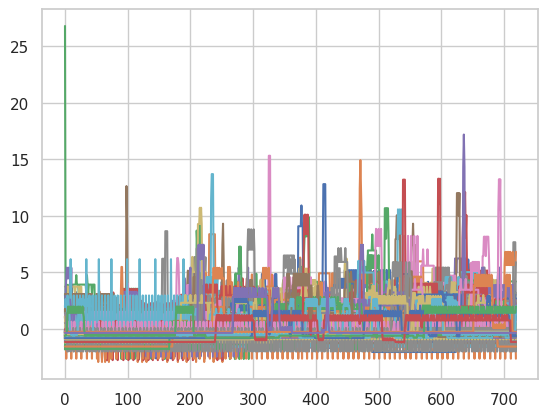

ShapeletSim : shape : (20, 500, 1) and number of classes : 2


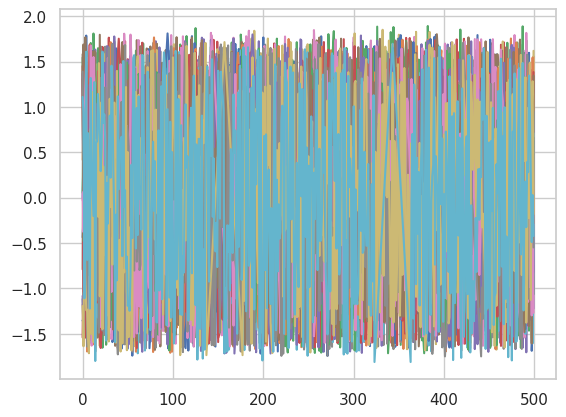

ShapesAll : shape : (600, 512, 1) and number of classes : 60


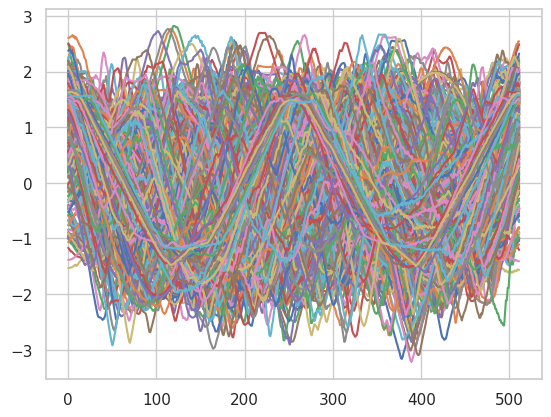

SmallKitchenAppliances : shape : (375, 720, 1) and number of classes : 3


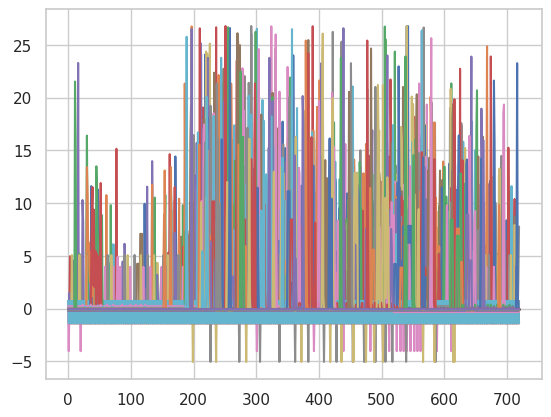

SonyAIBORobotSurface1 : shape : (20, 70, 1) and number of classes : 2


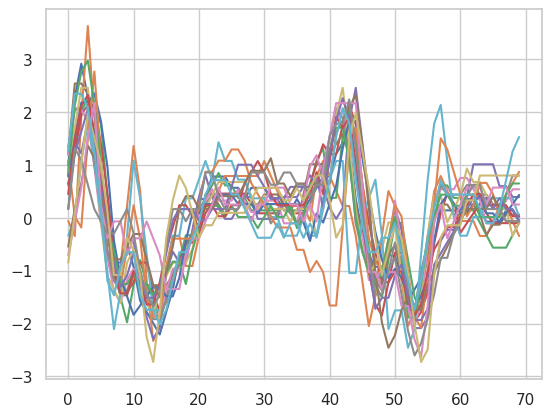

SonyAIBORobotSurface2 : shape : (27, 65, 1) and number of classes : 2


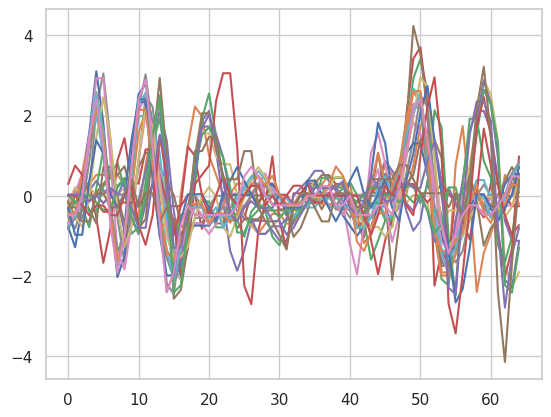

StarLightCurves : shape : (1000, 1024, 1) and number of classes : 3


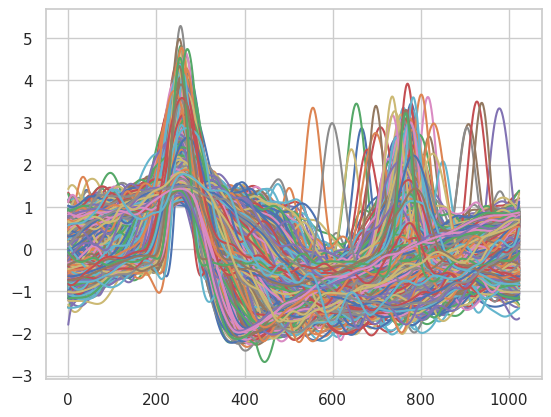

Strawberry : shape : (613, 235, 1) and number of classes : 2


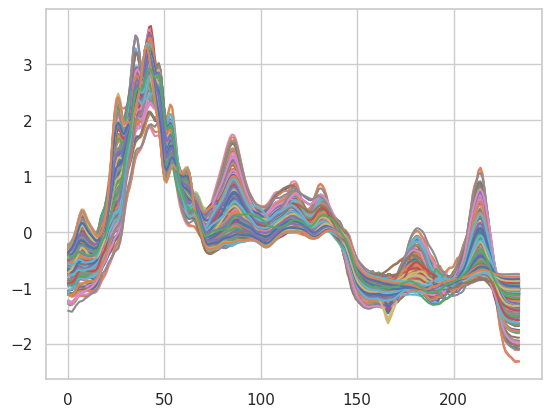

SwedishLeaf : shape : (500, 128, 1) and number of classes : 15


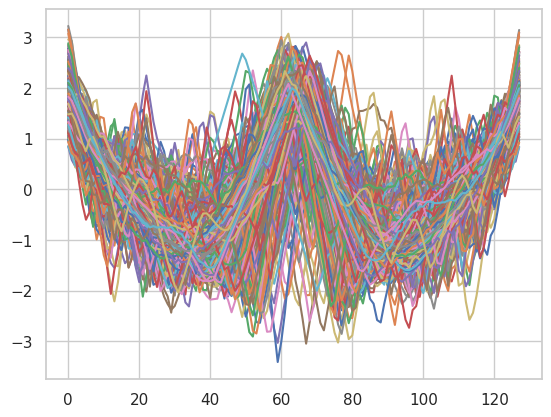

Symbols : shape : (25, 398, 1) and number of classes : 6


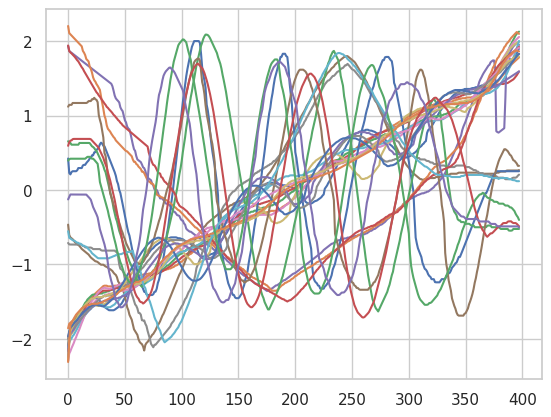

SyntheticControl : shape : (300, 60, 1) and number of classes : 6


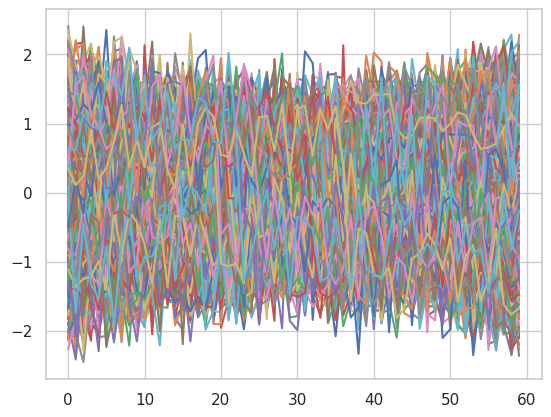

ToeSegmentation1 : shape : (40, 277, 1) and number of classes : 2


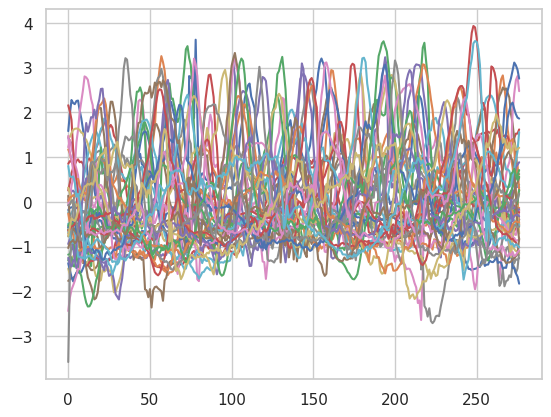

ToeSegmentation2 : shape : (36, 343, 1) and number of classes : 2


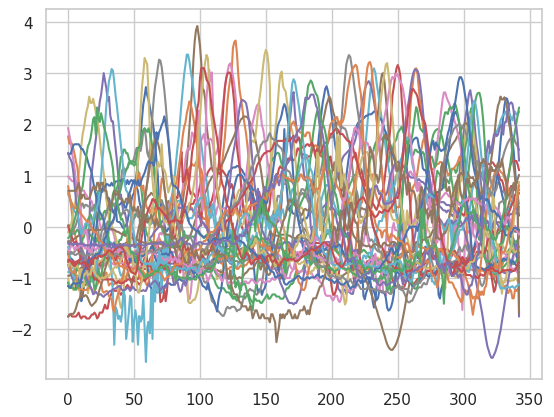

Trace : shape : (100, 275, 1) and number of classes : 4


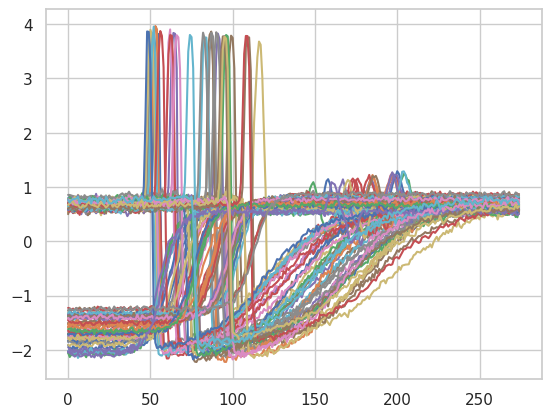

TwoLeadECG : shape : (23, 82, 1) and number of classes : 2


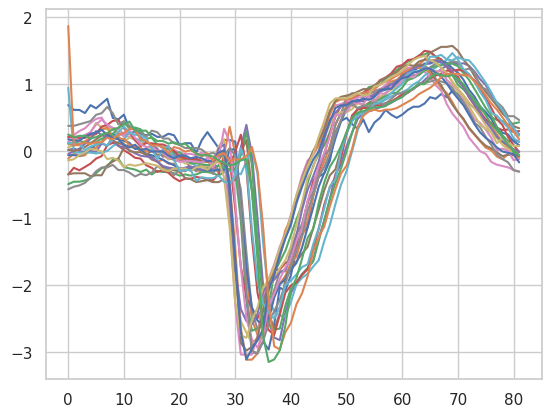

TwoPatterns : shape : (1000, 128, 1) and number of classes : 4


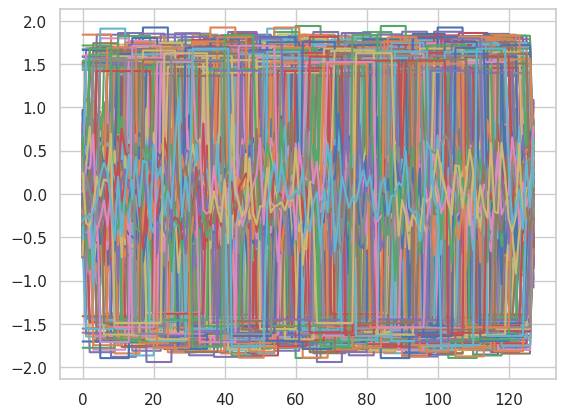

UWaveGestureLibraryX : shape : (896, 315, 1) and number of classes : 8


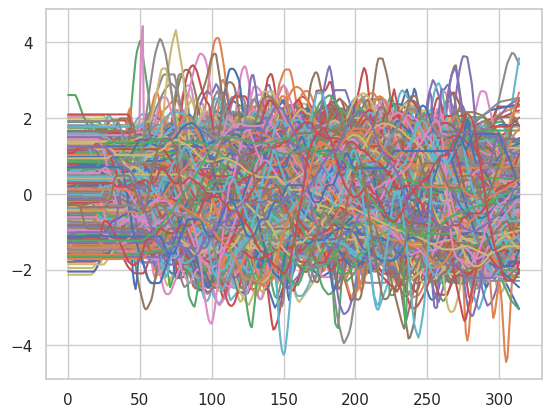

UWaveGestureLibraryY : shape : (896, 315, 1) and number of classes : 8


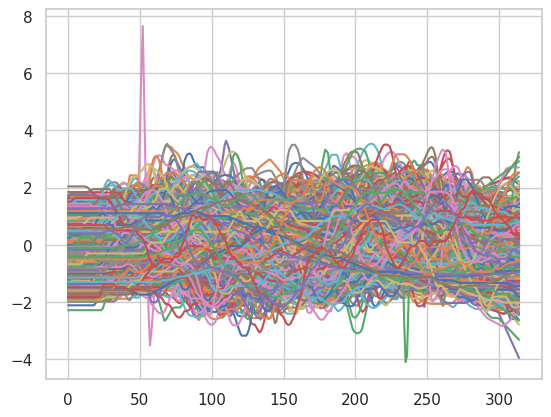

UWaveGestureLibraryZ : shape : (896, 315, 1) and number of classes : 8


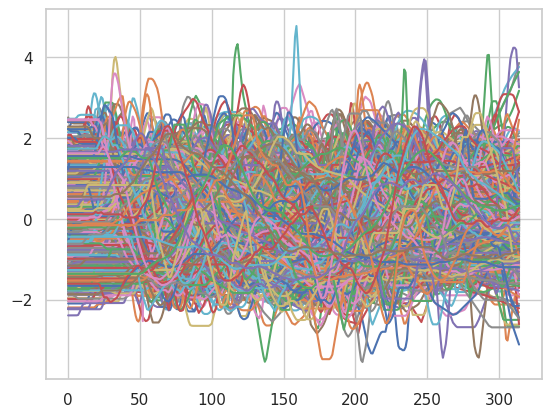

UWaveGestureLibraryAll : shape : (896, 945, 1) and number of classes : 8


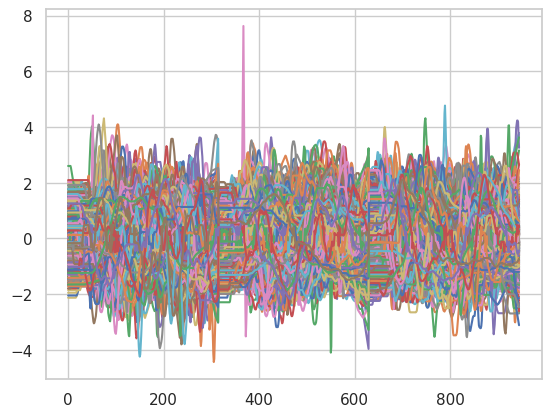

Wafer : shape : (1000, 152, 1) and number of classes : 2


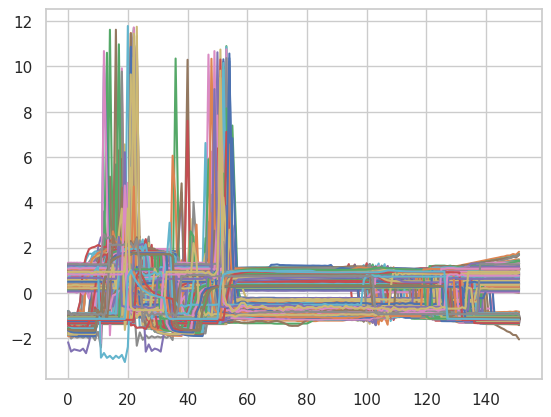

Wine : shape : (57, 234, 1) and number of classes : 2


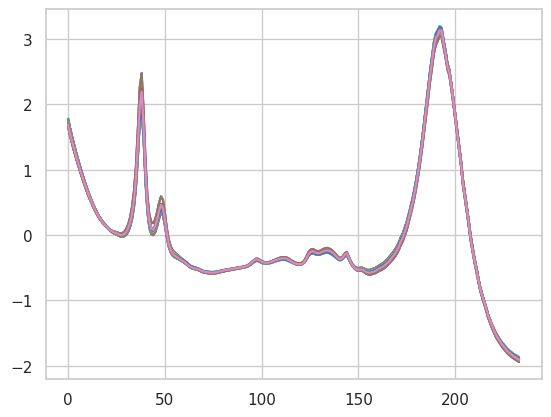

WordSynonyms : shape : (267, 270, 1) and number of classes : 25


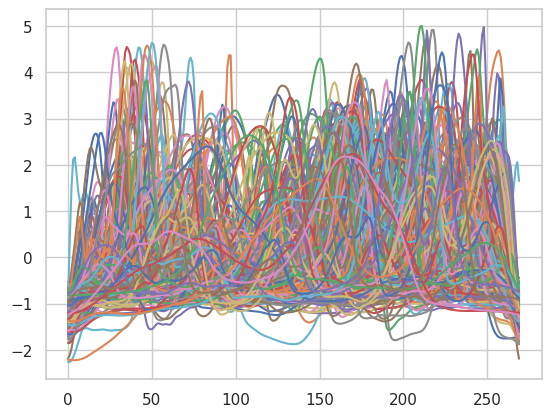

Worms : shape : (181, 900, 1) and number of classes : 5


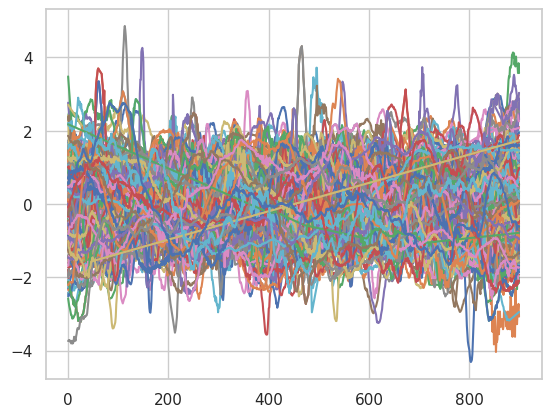

WormsTwoClass : shape : (181, 900, 1) and number of classes : 2


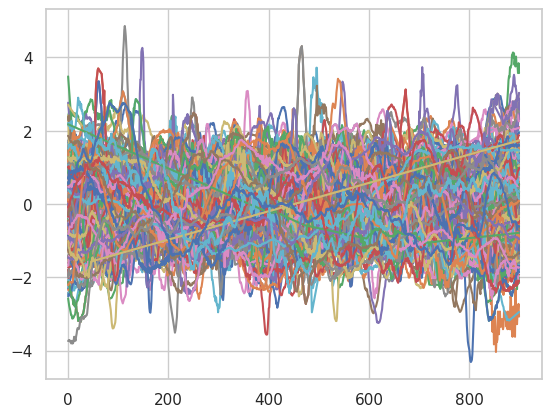

Yoga : shape : (300, 426, 1) and number of classes : 2


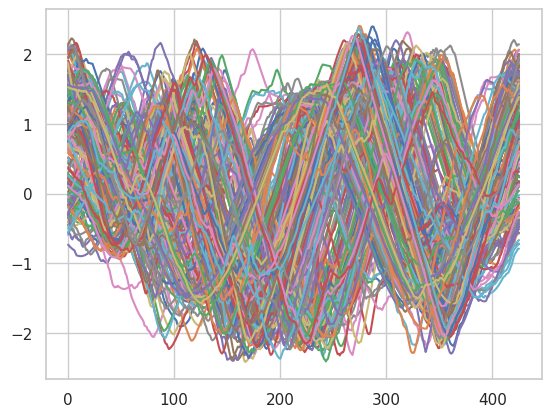

In [ ]:
for data_name in ucr.list_datasets():
    X_train_1, y_train, X_test, y_test = ucr.load_dataset(data_name)
    print(
        f"{data_name} : shape : {X_train_1.shape} and number of classes : {len(set(y_test))}"
    )
    for x in X_train_1:
        plt.plot(x)
    plt.show()
    if data_name == "Yoga":
        break

# Section 4.2 : Barycenter : Averaging with the soft-DTW

In [ ]:
def compute_barycenter(
    data_loader: DataLoader,
    criterion: str,
    gamma: float,
    length: int,
    lmbda: list,
    lr: float,
    reduction: str = "mean",
    num_epochs: int = 30,
    batch_size: int = 1,
) -> np.ndarray:
    """
    Compute the barycenters
    """
    x = torch.randn((batch_size, length, 1)).float()
    x.requires_grad_(True)
    optimizer = torch.optim.Adam([x], lr=lr)
    # x_rep = x.repeat(batch_size, 1, 1)
    dtw_loss = DTWLoss(gamma=gamma, reduction=reduction)
    for epoch in tqdm(range(num_epochs)):
        for i, y in enumerate(data_loader):
            if criterion == "l2":
                loss = torch.sum(
                    (
                        x.reshape(batch_size, length, 1) * lmbda[i]
                        - y.reshape(batch_size, length, 1) * lmbda[i]
                    )
                    ** 2
                )
            elif criterion == "dtw":
                loss = dtw_loss(
                    x.reshape(batch_size, length, 1) * lmbda[i],
                    y.reshape(batch_size, length, 1) * lmbda[i],
                )

            # print(loss)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
    return x[0, ...].cpu().detach().numpy()

In [ ]:
def compute_barycenter_factor(
    data_loader: DataLoader,
    criterion: str,
    gamma: float,
    length: int,
    lmbda: list,
    lr: float,
    reduction: str = "mean",
    num_epochs: int = 30,
    batch_size: int = 11,
    factor: int = 4,
) -> np.ndarray:
    """
    Compute the with down-sampling factors
    """
    x = torch.randn((batch_size, length // factor, 1)).float()
    x.requires_grad_(True)
    optimizer = torch.optim.Adam([x], lr=lr)
    # x_rep = x.repeat(batch_size, 1, 1)
    dtw_loss = DTWLoss(gamma=gamma, reduction=reduction)
    for epoch in tqdm(range(num_epochs)):
        for i, y in enumerate(data_loader):
            loss = dtw_loss(
                x.reshape(batch_size, length // factor, 1) * lmbda[i],
                y.reshape(batch_size, length, 1) * lmbda[i],
            )
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
    x = x[0, :, 0].cpu().detach().numpy()
    print(x.shape)
    f = interp1d(np.arange(len(x)), x, kind="linear")
    new_length = len(x) * factor
    x = f(np.linspace(0, len(x) - 1, new_length))

    return x

Try on well chosen dataset.

100%|██████████| 30/30 [00:00<00:00, 372.26it/s]


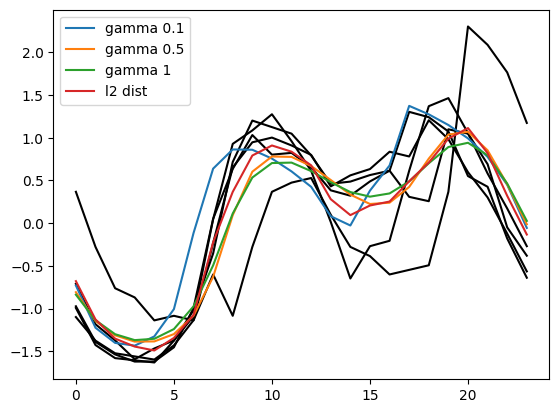

100%|██████████| 30/30 [00:00<00:00, 328.12it/s]


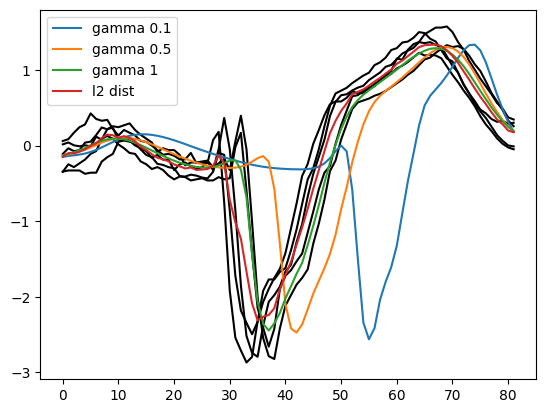

100%|██████████| 30/30 [00:00<00:00, 262.82it/s]


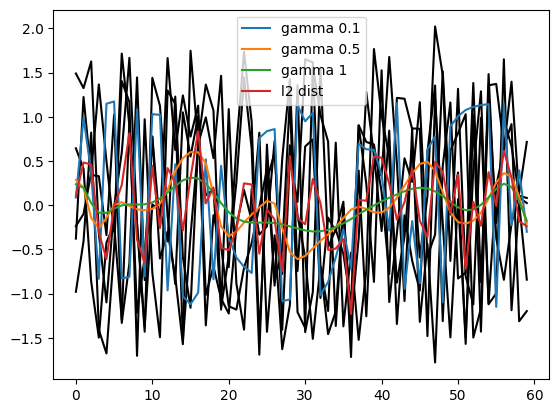

100%|██████████| 30/30 [00:00<00:00, 327.89it/s]


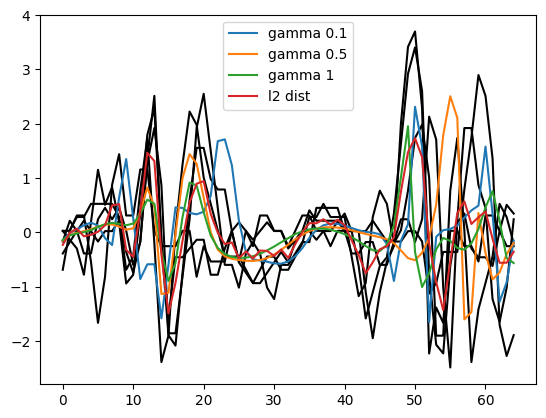

100%|██████████| 30/30 [00:00<00:00, 319.19it/s]


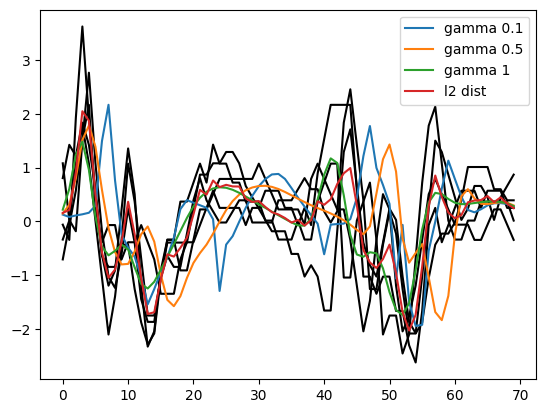

100%|██████████| 30/30 [00:00<00:00, 11201.74it/s]


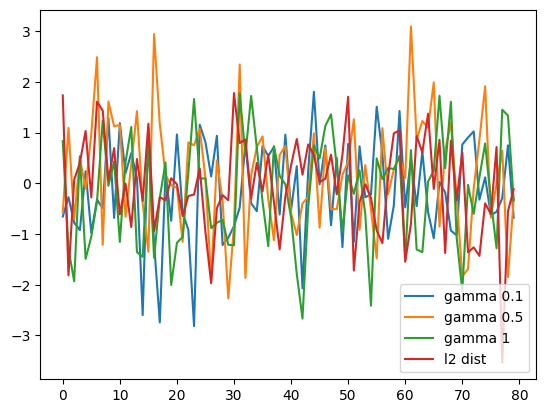

100%|██████████| 30/30 [00:00<00:00, 291.42it/s]


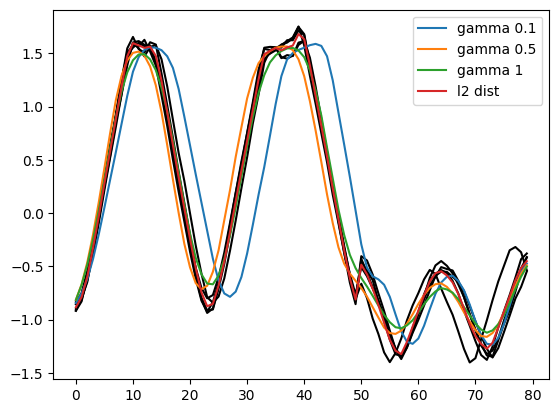

100%|██████████| 30/30 [00:00<00:00, 312.17it/s]


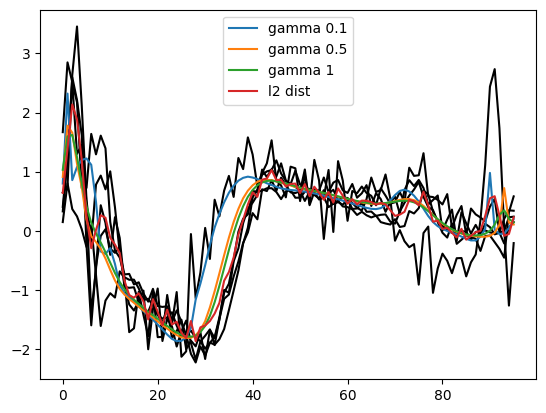

In [ ]:
list_dataset = [
    "ItalyPowerDemand",
    # 'Trace',
    "TwoLeadECG",
    "SyntheticControl",
    "SonyAIBORobotSurface2",
    "SonyAIBORobotSurface1",
    "ProximalPhalanxTW",
    "ProximalPhalanxOutlineAgeGroup",
    "ECG200",
]
for dataset_name in list_dataset:
    X_train_1, y_train, X_test, y_test = ucr.load_dataset(dataset_name)
    X_train_1 = torch.tensor(X_train_1).float()
    X_train = X_train_1[y_train == classes[0]]

    # cst
    batch_size = 1
    lr = 0.1
    dim, length, _ = X_train_1.shape
    classes = list(set(y_train))
    n_classes = len(classes)
    lmbda = [0.5] * dim
    n = min(5, X_train.shape[0])

    data_loader = DataLoader(X_train[:n], batch_size=batch_size)

    # plot some training signals
    for i in range(n):
        plt.plot(X_train[i], color="k")

    # compute barycenter for different gamma
    for gamma in [0.1, 0.5, 1]:
        x = compute_barycenter(
            data_loader=data_loader,
            gamma=gamma,
            length=length,
            lmbda=lmbda,
            lr=lr,
            criterion="dtw",
        )
        plt.plot(x, label=f"gamma {gamma}")

    # compute barycenter for l2
    x = compute_barycenter(
        data_loader=data_loader,
        gamma=gamma,
        length=length,
        lmbda=lmbda,
        lr=lr,
        criterion="l2",
    )
    plt.plot(x, label=f"l2 dist")

    plt.legend()
    plt.plot()
    plt.show()

Try down-sampling approaches.

100%|██████████| 30/30 [05:10<00:00, 10.37s/it]


(80,)


100%|██████████| 30/30 [02:36<00:00,  5.22s/it]


(40,)


100%|██████████| 30/30 [01:19<00:00,  2.64s/it]


(20,)


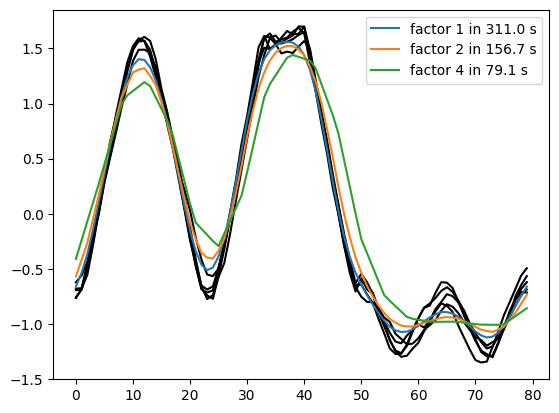

In [ ]:
list_dataset = [
    "ProximalPhalanxOutlineAgeGroup",
]
for dataset_name in list_dataset:
    X_train_1, y_train, X_test, y_test = ucr.load_dataset(dataset_name)
    X_train_1 = torch.tensor(X_train_1).float()
    classes = list(set(y_train))
    X_train = X_train_1[y_train == classes[0]]

    # cst
    batch_size = 1
    lr = 0.1
    classes = list(set(y_train))
    dim, length, _ = X_train_1.shape
    classes = list(set(y_train))
    n_classes = len(classes)
    lmbda = [0.5] * dim
    n = min(5, X_train.shape[0])

    data_loader = DataLoader(X_train[:n], batch_size=batch_size)

    # plot some training signals
    for i in range(n):
        plt.plot(X_train[i], color="k")

    # compute barycenter for different gamma
    from time import time

    for factor in [1, 2, 4]:
        start = time()
        x = compute_barycenter_factor(
            data_loader=data_loader,
            gamma=1,
            length=length,
            lmbda=lmbda,
            lr=lr,
            criterion="dtw",
            factor=factor,
        )
        plt.plot(x, label=f"factor {factor} in {np.round((time() - start), 1)} s")

    plt.legend()
    plt.plot()
    plt.show()

# Section 4.3 : Generalization : K-Means with soft-DTW

In [ ]:
def kmeans_dtw_torch(
    X: torch.Tensor,
    k: int,
    max_iter: int = 10,
    gamma: int = 1,
    lr: float = 0.1,
    inner_iter: int = 30,
) -> tuple:
    """
    K means with Soft DTW
    """
    dtw_loss = DTWLoss(gamma=gamma, reduction="mean")
    n_samples, lenght, n_features = X.shape

    centroids_idx = torch.randint(0, n_samples, (k,))
    centroids = torch.randn(k, lenght, n_features)

    for _ in tqdm(range(max_iter)):
        # Assignment step
        clusters = [[] for _ in range(k)]
        for i, x in enumerate(X):
            distances = [
                dtw_loss(
                    x.unsqueeze(0).reshape(1, 1, lenght),
                    centroid.unsqueeze(0).reshape(1, 1, lenght),
                )
                for centroid in centroids
            ]
            # Assign to the closest centroid
            closest_centroid = torch.argmin(torch.tensor(distances))
            clusters[closest_centroid].append(i)

        # Update step
        new_centroids = []
        for cluster in clusters:
            if len(cluster) == 0:
                # If a cluster is empty, reinitialize its centroid randomly
                new_centroid = X[torch.randint(0, n_samples, (1,))]
            else:
                # Initialize centroid for optimization
                centroid = torch.mean(X[cluster], dim=0, keepdim=True)
                centroid.requires_grad_(True)
                optimizer = torch.optim.Adam([centroid], lr=lr)

                # Optimize centroid
                for epoch in range(inner_iter):
                    total_loss = 0
                    for i in cluster:
                        y = X[i].unsqueeze(0)
                        loss = dtw_loss(
                            centroid.reshape(1, lenght, 1), y.reshape(1, lenght, 1)
                        )
                        total_loss += loss
                    total_loss /= len(cluster)

                    # Backward and optimize
                    optimizer.zero_grad()
                    total_loss.backward()
                    optimizer.step()

                new_centroid = centroid.detach()

            new_centroids.append(new_centroid)

        new_centroids = torch.stack(new_centroids)

        if torch.equal(centroids, new_centroids):
            break
        centroids = new_centroids

    return centroids, clusters

In [ ]:
def kmeans_l2_torch(
    X: torch.Tensor,
    k: int,
    max_iter: int = 100,
    gamma: int = 1,
    lr: float = 0.1,
    inner_iter: int = 100,
) -> tuple:
    """
    K means with MSE
    """
    dtw_loss = DTWLoss(gamma=gamma, reduction="mean")
    n_samples, lenght, n_features = X.shape

    centroids_idx = torch.randint(0, n_samples, (k,))
    centroids = torch.randn(k, lenght, n_features)

    for _ in range(max_iter):
        # Assignment step
        clusters = [[] for _ in range(k)]
        for i, x in enumerate(X):
            distances = [
                torch.sqrt(
                    torch.sum(
                        (
                            x.unsqueeze(0).reshape(1, lenght, 1)
                            - centroid.unsqueeze(0).reshape(1, lenght, 1)
                        )
                        ** 2
                    )
                )
                for centroid in centroids
            ]
            # Assign to the closest centroid
            closest_centroid = torch.argmin(torch.tensor(distances))
            clusters[closest_centroid].append(i)

        # Update step
        new_centroids = []
        for cluster in clusters:
            if len(cluster) == 0:
                # If a cluster is empty, reinitialize its centroid randomly
                new_centroid = X[torch.randint(0, n_samples, (1,))]
            else:
                # Initialize centroid for optimization
                centroid = torch.mean(X[cluster], dim=0, keepdim=True)
                centroid.requires_grad_(True)
                optimizer = torch.optim.Adam([centroid], lr=lr)

                # Optimize centroid
                for epoch in range(inner_iter):
                    total_loss = 0
                    for i in cluster:
                        y = X[i].unsqueeze(0)
                        loss = torch.sqrt(
                            torch.sum(
                                (
                                    centroid.reshape(1, lenght, 1)
                                    - y.reshape(1, lenght, 1)
                                )
                                ** 2
                            )
                        )
                        total_loss += loss
                    total_loss /= len(cluster)

                    # Backward and optimize
                    optimizer.zero_grad()
                    total_loss.backward()
                    optimizer.step()

                new_centroid = centroid.detach()

            new_centroids.append(new_centroid)

        new_centroids = torch.stack(new_centroids)

        if torch.equal(centroids, new_centroids):
            break
        centroids = new_centroids

    return centroids, clusters

In [ ]:
X_train_1, y_train, X_test, y_test = ucr.load_dataset("SonyAIBORobotSurface2")
X_train_1 = torch.tensor(X_train_1).float()

X_train_1 = X_train_1[np.isin(y_train, [1, 2])]
y_train = y_train[np.isin(y_train, [1, 2])]
k = 2  # Number of clusters
centroids, clusters = kmeans_dtw_torch(X_train_1, k)
centroids_l2, clusters_l2 = kmeans_l2_torch(X_train_1, k)

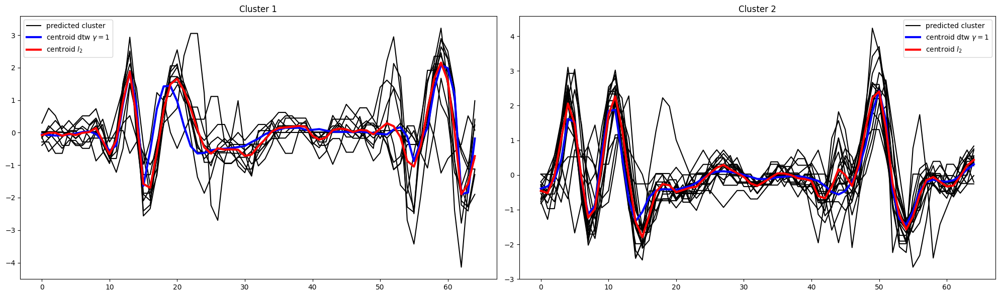

In [ ]:
# Creating subplots instead of separate figures
fig, axs = plt.subplots(1, 2, figsize=(20, 6))

first_label = True
for index in clusters[1]:
    if first_label:
        axs[0].plot(X_train_1[index, :, 0], "k", label="predicted cluster")
        first_label = False
    else:
        axs[0].plot(X_train_1[index, :, 0], "k")

axs[0].plot(centroids[1].squeeze(0), "b", label="centroid dtw $\gamma=1$", linewidth=3)
axs[0].plot(centroids_l2[1].squeeze(0), "r", label="centroid $l_2$", linewidth=3)
axs[0].legend()
axs[0].set_title("Cluster 1")

first_label = True
for index in clusters[0]:
    if first_label:
        axs[1].plot(X_train_1[index, :, 0], "k", label="predicted cluster")
        first_label = False
    else:
        axs[1].plot(X_train_1[index, :, 0], "k")

axs[1].plot(centroids[0].squeeze(0), "b", label="centroid dtw $\gamma=1$", linewidth=3)
axs[1].plot(centroids_l2[0].squeeze(0), "r", label="centroid $l_2$", linewidth=3)
axs[1].legend()
axs[1].set_title("Cluster 2")

# axs[1].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
X_train_1, y_train, X_test, y_test = ucr.load_dataset("ItalyPowerDemand")
X_train_1 = torch.tensor(X_train_1).float()

X_train_1 = X_train_1[np.isin(y_train, [1, 2])]
y_train = y_train[np.isin(y_train, [1, 2])]
k = 2  # Number of clusters
centroids, clusters = kmeans_dtw_torch(X_train_1, k)

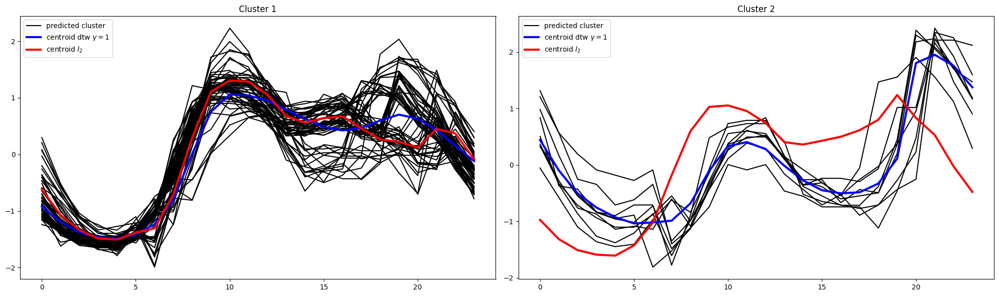

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(20, 6))

first_label = True
for index in clusters[1]:
    if first_label:
        axs[0].plot(X_train_1[index, :, 0], "k", label="predicted cluster")
        first_label = False
    else:
        axs[0].plot(X_train_1[index, :, 0], "k")

axs[0].plot(centroids[1].squeeze(0), "b", label="centroid dtw $\gamma=1$", linewidth=3)
axs[0].plot(centroids_l2[1].squeeze(0), "r", label="centroid $l_2$", linewidth=3)
axs[0].legend()
axs[0].set_title("Cluster 1")

first_label = True
for index in clusters[0]:
    if first_label:
        axs[0].plot(X_train_1[index, :, 0], "g", label="predicted cluster")
        first_label = False
    else:
        axs[0].plot(X_train_1[index, :, 0], "g")

axs[0].plot(centroids[0].squeeze(0), "b", label="centroid dtw $\gamma=1$", linewidth=3)
axs[0].plot(centroids_l2[0].squeeze(0), "r", label="centroid $l_2$", linewidth=3)
axs[0].legend()
axs[0].set_title("Cluster 2")

# axs[1].axis('off')

plt.tight_layout()
plt.show()